<a href="https://colab.research.google.com/github/DanendraPassadhi/PCVK/blob/main/PCVK_Week11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# D1. Praktikum Deteksi Obyek Dasar


## Object Detection
Metode yang digunakan:
1. Template Matching
2. Edge Detection
3. Corner Detection
4. Grid Detection
5. Contour Detection

### Import Library dan Mount Drive

In [ ]:
#import library yang dibutuhkan
import cv2 as cv
import numpy as np
from matplotlib import pyplot as plt

In [ ]:
#Akses drive
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


## Template Matching
Menggunakan library openCV.
**cv.matchTemplate()**, dengan parameter:
- **image**: citra input
- **templ**: template yang dicari, ukurannya tidak boleh lebih besar dari citra input
- **method**: metode dari template matching
Jenis metode template matching di OpenCV:
1. TM_SQDIFF
2. TM_SQDIFF_NORMED
3. TM_CCORR
4. TM_CCORR_NORMED
5. TM_CCOEFF
6. TM_CCOEFF_NORMED

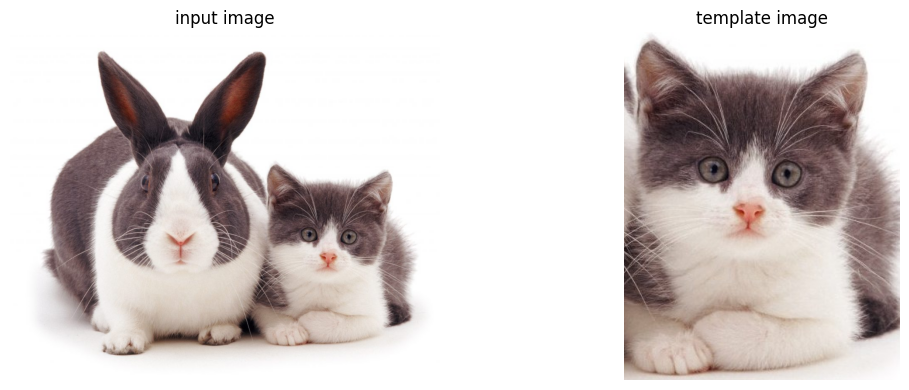

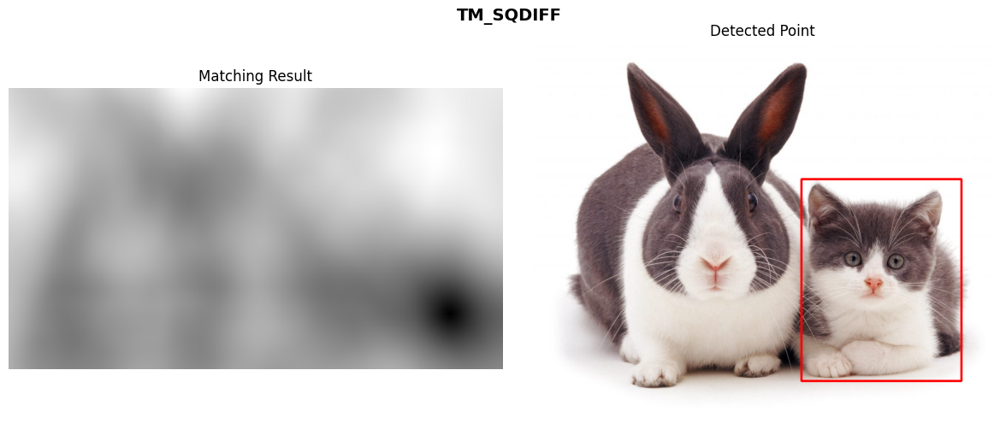

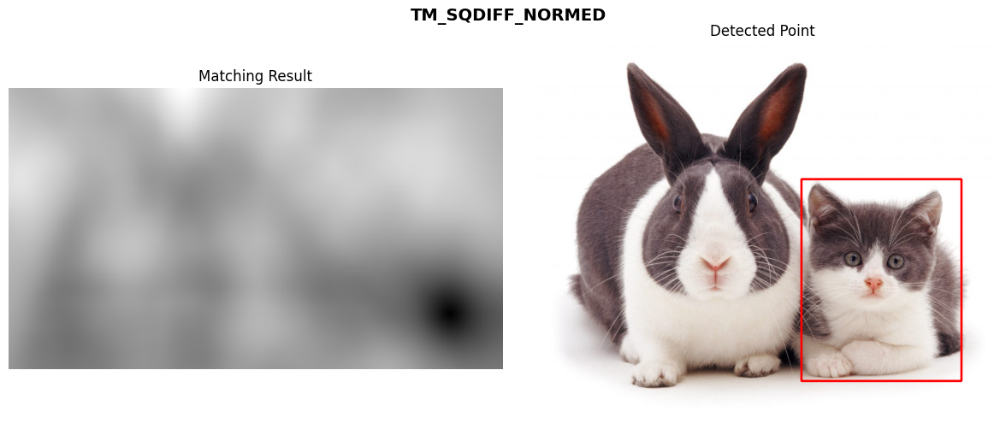

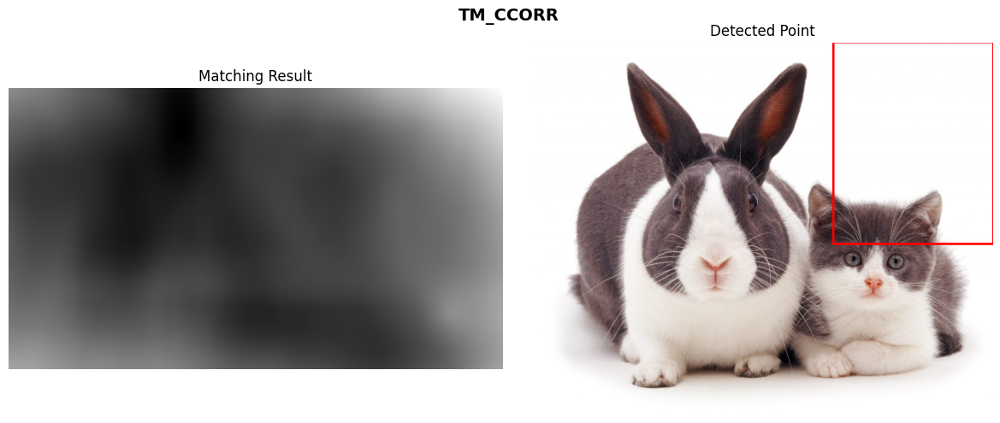

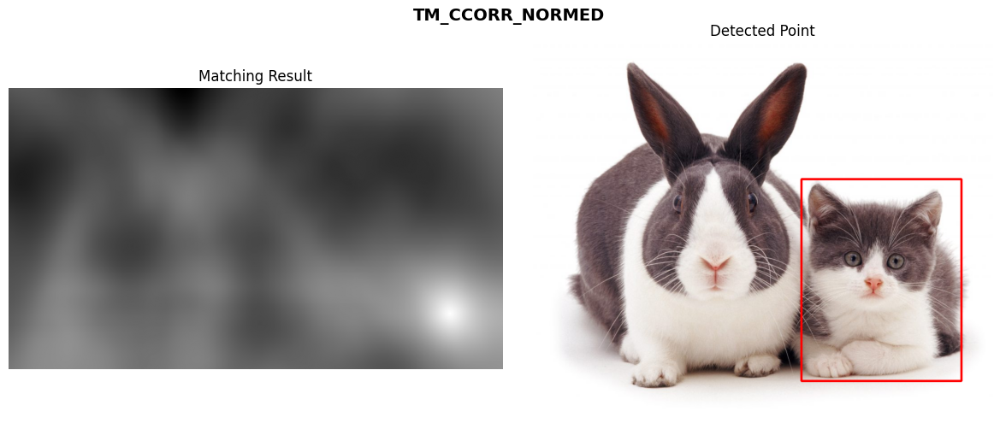

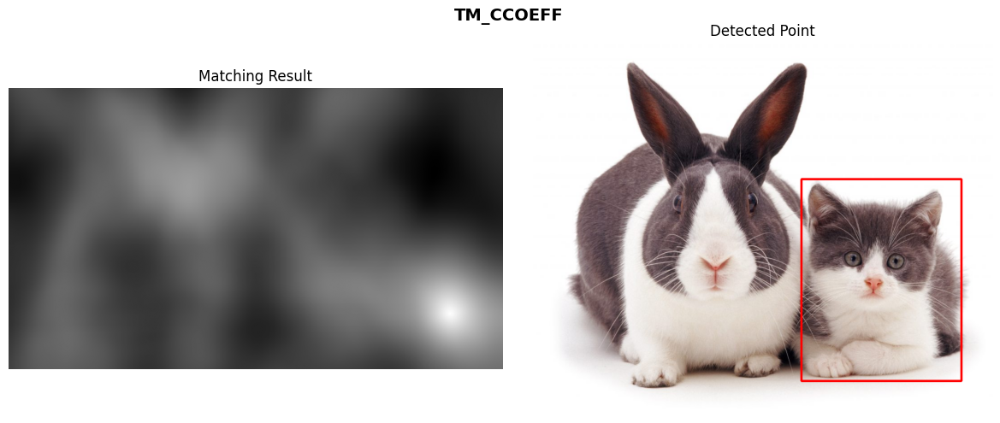

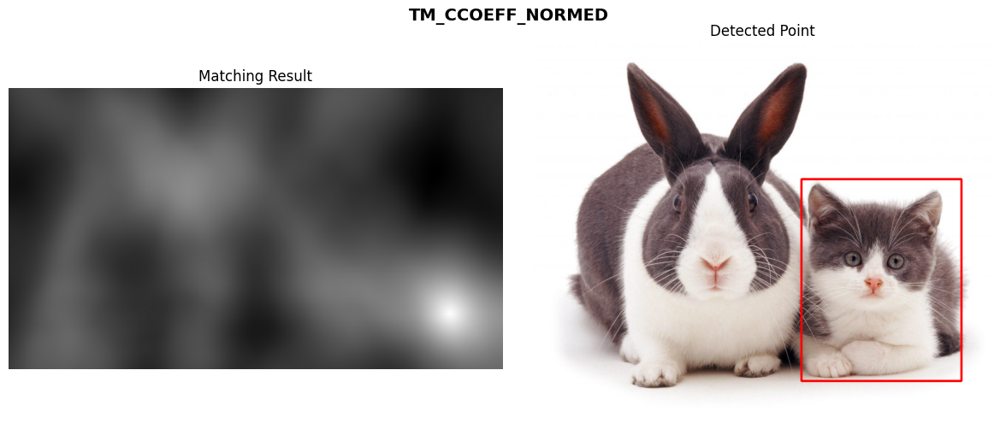

In [ ]:
# Membaca gambar input dan template
image = cv.imread('/content/drive/MyDrive/PCVK/cats_and_bunnies.jpg')
template = cv.imread('/content/drive/MyDrive/PCVK/cat2_templatejpg.jpg')

# Konversi ke grayscale untuk template matching
image_gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)
template_gray = cv.cvtColor(template, cv.COLOR_BGR2GRAY)

# Mendapatkan dimensi template
h, w = template_gray.shape

# Definisi 6 metode template matching
methods = [
    'cv.TM_SQDIFF',
    'cv.TM_SQDIFF_NORMED',
    'cv.TM_CCORR',
    'cv.TM_CCORR_NORMED',
    'cv.TM_CCOEFF',
    'cv.TM_CCOEFF_NORMED'
]

# Menampilkan gambar input dan template
fig, axes = plt.subplots(1, 2, figsize=(12, 4))
image_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
axes[0].set_title('input image')
axes[0].imshow(image_rgb)
axes[0].axis('off')

template_rgb = cv.cvtColor(template, cv.COLOR_BGR2RGB)
axes[1].set_title('template image')
axes[1].imshow(template_rgb)
axes[1].axis('off')
plt.tight_layout()
plt.show()

# Membuat figure untuk menampilkan hasil (2 kolom per metode)
for method_name in methods:
    # Mendapatkan metode dari string
    method = eval(method_name)

    # Melakukan template matching
    result = cv.matchTemplate(image_gray, template_gray, method)

    # Normalisasi hasil untuk visualisasi yang lebih baik
    result_normalized = cv.normalize(result, None, 0, 255, cv.NORM_MINMAX, cv.CV_8U)

    # Untuk TM_SQDIFF dan TM_SQDIFF_NORMED, nilai minimum adalah best match
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)
        top_left = min_loc
    else:
        min_val, max_val, min_loc, max_loc = cv.minMaxLoc(result)
        top_left = max_loc

    # Menghitung bottom right corner
    bottom_right = (top_left[0] + w, top_left[1] + h)

    # Copy gambar untuk menggambar rectangle
    img_display = image.copy()
    cv.rectangle(img_display, top_left, bottom_right, (0, 0, 255), 3)
    img_display_rgb = cv.cvtColor(img_display, cv.COLOR_BGR2RGB)

    # Membuat figure dengan 1 baris, 2 kolom
    fig, axes = plt.subplots(1, 2, figsize=(12, 5))

    # Kolom kiri: Matching Result (heatmap grayscale)
    axes[0].imshow(result_normalized, cmap='gray')
    axes[0].set_title('Matching Result')
    axes[0].axis('off')

    # Kolom kanan: Detected Point (gambar dengan bounding box)
    axes[1].imshow(img_display_rgb)
    axes[1].set_title('Detected Point')
    axes[1].axis('off')

    # Judul keseluruhan
    method_label = method_name.split('.')[-1]
    fig.suptitle(method_label, fontsize=14, fontweight='bold')

    plt.tight_layout()
    plt.savefig(f'{method_label}_result.png', dpi=150, bbox_inches='tight')
    plt.show()


## Implementasikan konsep template matching tanpa menggunakan library OpenCV untuk multiple object

Detected: 6 objects


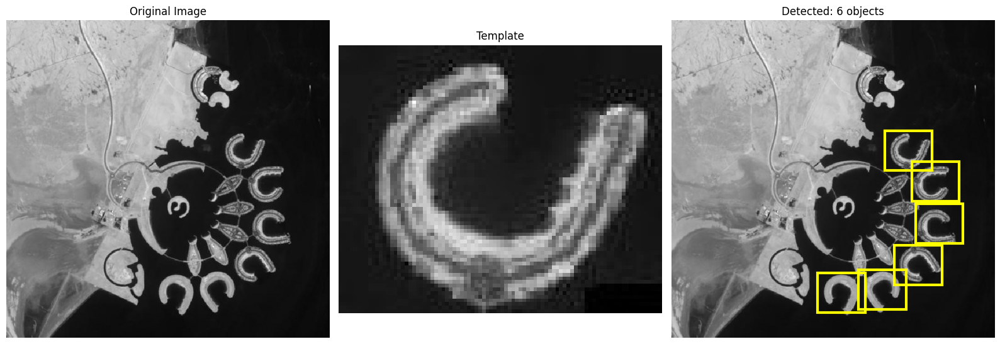

In [ ]:
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.patches as patches
from scipy import ndimage


def load_image_as_grayscale(filename):
    """Memuat gambar dan mengkonversi ke grayscale"""
    img = Image.open(filename).convert('L')
    return np.array(img, dtype=np.float32)


def rotate_template(template, angle):
    """Rotasi template dengan angle tertentu"""
    rotated = ndimage.rotate(template, angle, reshape=True, order=1, mode='constant', cval=0)
    return rotated


def flip_template(template, flip_mode):
    """Flip template"""
    if flip_mode == 0:
        return np.fliplr(template)
    elif flip_mode == 1:
        return np.flipud(template)
    elif flip_mode == 2:
        return np.flipud(np.fliplr(template))
    return template


def normalized_cross_correlation(image, template):
    """Implementasi NCC yang dioptimasi"""
    img_h, img_w = image.shape
    temp_h, temp_w = template.shape

    if temp_h > img_h or temp_w > img_w:
        return None

    result_h = img_h - temp_h + 1
    result_w = img_w - temp_w + 1
    result = np.zeros((result_h, result_w), dtype=np.float32)

    template_mean = np.mean(template)
    template_norm = template - template_mean
    template_std = np.sqrt(np.sum(template_norm ** 2))

    if template_std == 0:
        return result

    for y in range(result_h):
        for x in range(result_w):
            patch = image[y:y+temp_h, x:x+temp_w]
            patch_mean = np.mean(patch)
            patch_norm = patch - patch_mean
            patch_std = np.sqrt(np.sum(patch_norm ** 2))

            if patch_std > 0:
                result[y, x] = np.sum(template_norm * patch_norm) / (template_std * patch_std)

    return result


def process_batch(image, template, angles, flip_mode=None):
    """Proses satu batch angles dengan flip mode tertentu"""
    img_h, img_w = image.shape
    best_correlation_map = np.full((img_h, img_w), -np.inf, dtype=np.float32)

    if flip_mode is not None:
        template = flip_template(template, flip_mode)

    for angle in angles:
        transformed_template = rotate_template(template, angle)
        correlation_map = normalized_cross_correlation(image, transformed_template)

        if correlation_map is not None:
            result_h, result_w = correlation_map.shape
            best_correlation_map[:result_h, :result_w] = np.maximum(
                best_correlation_map[:result_h, :result_w],
                correlation_map
            )

    return best_correlation_map


def multi_transform_template_matching_batched(image, template):
    """Template matching dengan batch processing"""
    img_h, img_w = image.shape
    best_correlation_map = np.full((img_h, img_w), -np.inf, dtype=np.float32)

    angle_batches = [
        range(0, 90, 30),
        range(90, 180, 30),
        range(180, 270, 30),
        range(270, 360, 30),
    ]

    flip_modes = [None, 0]

    for flip_mode in flip_modes:
        for angles in angle_batches:
            batch_result = process_batch(image, template, angles, flip_mode)
            best_correlation_map = np.maximum(best_correlation_map, batch_result)

    return best_correlation_map


def find_multiple_matches(correlation_map, template_size, threshold, nms_threshold=0.35):
    """Menemukan multiple matches"""
    matches = []
    match_locations = np.where(correlation_map >= threshold)

    temp_h, temp_w = template_size

    for y, x in zip(match_locations[0], match_locations[1]):
        score = correlation_map[y, x]
        matches.append({
            'x': x,
            'y': y,
            'score': score,
            'width': temp_w,
            'height': temp_h
        })

    if len(matches) > 0:
        matches = non_maximum_suppression(matches, nms_threshold)

    return matches


def non_maximum_suppression(matches, overlap_threshold=0.35):
    """Non-Maximum Suppression"""
    if len(matches) == 0:
        return []

    matches = sorted(matches, key=lambda x: x['score'], reverse=True)
    selected_matches = []

    while len(matches) > 0:
        best_match = matches.pop(0)
        selected_matches.append(best_match)
        matches = [m for m in matches if compute_iou(best_match, m) < overlap_threshold]

    return selected_matches


def compute_iou(box1, box2):
    """Menghitung Intersection over Union"""
    x1_min, y1_min = box1['x'], box1['y']
    x1_max, y1_max = x1_min + box1['width'], y1_min + box1['height']

    x2_min, y2_min = box2['x'], box2['y']
    x2_max, y2_max = x2_min + box2['width'], y2_min + box2['height']

    x_intersection = max(0, min(x1_max, x2_max) - max(x1_min, x2_min))
    y_intersection = max(0, min(y1_max, y2_max) - max(y1_min, y2_min))
    intersection_area = x_intersection * y_intersection

    box1_area = box1['width'] * box1['height']
    box2_area = box2['width'] * box2['height']
    union_area = box1_area + box2_area - intersection_area

    if union_area == 0:
        return 0
    return intersection_area / union_area


def visualize_results(image, template, matches):
    """Visualisasi hasil dengan original image dan template"""
    fig, axes = plt.subplots(1, 3, figsize=(16, 6))

    # Original image
    axes[0].imshow(image, cmap='gray')
    axes[0].set_title('Original Image')
    axes[0].axis('off')

    # Template
    axes[1].imshow(template, cmap='gray')
    axes[1].set_title('Template')
    axes[1].axis('off')

    # Detection result
    axes[2].imshow(image, cmap='gray')

    for match in matches:
        rect = patches.Rectangle(
            (match['x'], match['y']),
            match['width'],
            match['height'],
            linewidth=3,
            edgecolor='yellow',
            facecolor='none'
        )
        axes[2].add_patch(rect)

    axes[2].set_title(f'Detected: {len(matches)} objects')
    axes[2].axis('off')

    plt.tight_layout()
    plt.savefig('result.png', dpi=150, bbox_inches='tight')
    plt.show()


# Main program
if __name__ == "__main__":
    image = load_image_as_grayscale('/content/drive/MyDrive/PCVK/bahrain.jpg')
    template = load_image_as_grayscale('/content/drive/MyDrive/PCVK/bahrain-template.jpg')

    correlation_map = multi_transform_template_matching_batched(image, template)

    matches = find_multiple_matches(
        correlation_map,
        template.shape,
        threshold=0.55,
        nms_threshold=0.35
    )

    print(f"Detected: {len(matches)} objects")

    visualize_results(image, template, matches)


## Implementasikan metode Sobel Edge Detection, Canny Edge Detection, dan Laplacian Edge Detectio

### Sobel Edge Detection

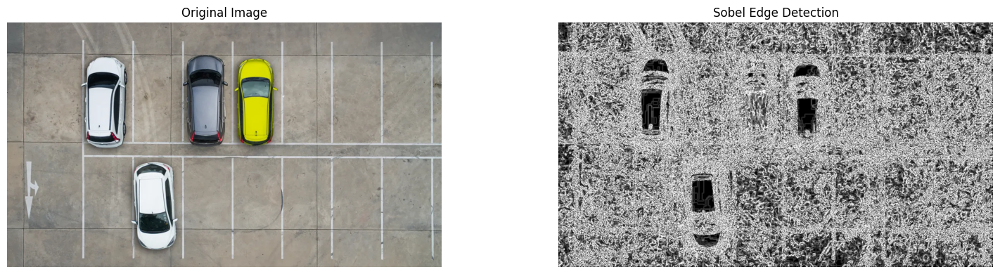

In [ ]:
# Membaca gambar
image = cv.imread('/content/drive/MyDrive/PCVK/car-park.jpg')
gray = cv.cvtColor(image, cv.COLOR_BGR2GRAY)

# Mengurangi noise dengan Gaussian Blur
img_blur = cv.GaussianBlur(gray, (3, 3), 0)

# Sobel X (deteksi tepi horizontal)
sobelx = cv.Sobel(img_blur, cv.CV_64F, 1, 0, ksize=5)
sobelx = np.uint8(np.absolute(sobelx))

# Sobel Y (deteksi tepi vertikal)
sobely = cv.Sobel(img_blur, cv.CV_64F, 0, 1, ksize=5)
sobely = np.uint8(np.absolute(sobely))

# Sobel XY (kombinasi)
sobelxy = cv.bitwise_or(sobelx, sobely)

fig, axes = plt.subplots(1, 2, figsize=(16, 4))

img_rgb = cv.cvtColor(image, cv.COLOR_BGR2RGB)
axes[0].imshow(img_rgb)
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(sobelxy, cmap='gray')
axes[1].set_title('Sobel Edge Detection')
axes[1].axis('off')

plt.tight_layout()
plt.savefig('edge_detection_comparison.png', dpi=150, bbox_inches='tight')
plt.show()

### Canny Edge Detection

(np.float64(-0.5), np.float64(1099.5), np.float64(618.5), np.float64(-0.5))

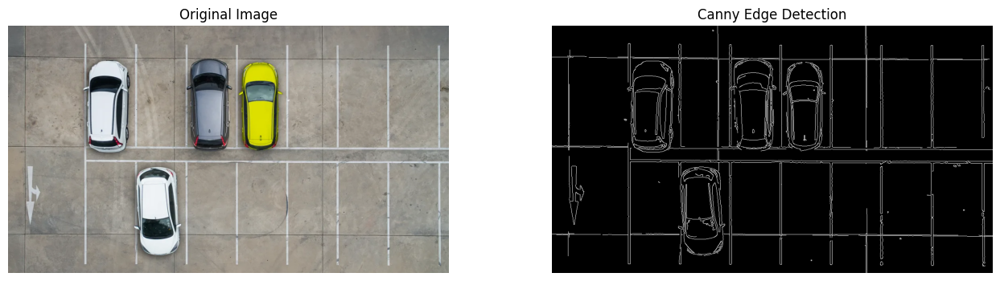

In [ ]:
# 2. Canny Edge Detection
canny_edges = cv.Canny(img_blur, threshold1=100, threshold2=200)

fig, axes = plt.subplots(1, 2, figsize=(16, 4))
axes[0].imshow(img_rgb, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(canny_edges, cmap='gray')
axes[1].set_title('Canny Edge Detection')
axes[1].axis('off')

### Canny Edge Detection

(np.float64(-0.5), np.float64(1099.5), np.float64(618.5), np.float64(-0.5))

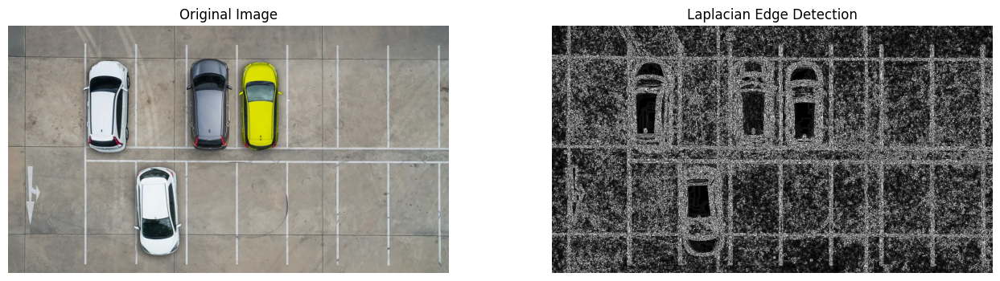

In [ ]:
# 3. Laplacian Edge Detection
laplacian = cv.Laplacian(img_blur, cv.CV_64F, ksize=5)
laplacian = np.uint8(np.absolute(laplacian))

fig, axes = plt.subplots(1, 2, figsize=(16, 4))
axes[0].imshow(img_rgb, cmap='gray')
axes[0].set_title('Original Image')
axes[0].axis('off')

axes[1].imshow(laplacian, cmap='gray')
axes[1].set_title('Laplacian Edge Detection')
axes[1].axis('off')

## Implementasikan metode Harris Corner Detection dan Shi-Tomasi Detection

### metode Harris Corner Detection

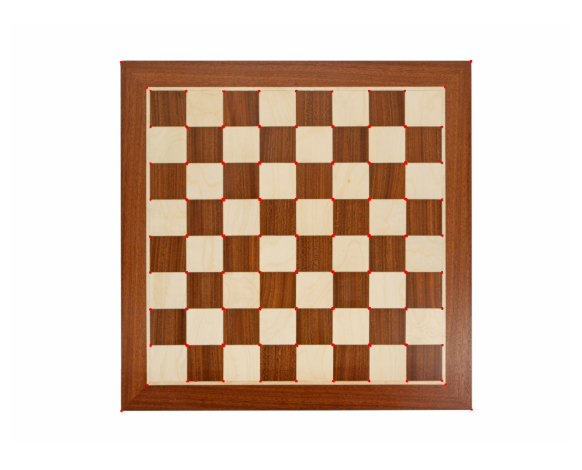

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/chess-board.jpg')
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
gray_float = np.float32(gray)

harris_corners = cv.cornerHarris(gray_float, blockSize=2, ksize=3, k=0.04)

# Dilate untuk marking corners
harris_corners = cv.dilate(harris_corners, None)

# Buat copy gambar untuk Harris
img_harris = img.copy()

# Tandai corners dengan warna merah (threshold: 0.01 * max corner response)
img_harris[harris_corners > 0.01 * harris_corners.max()] = [0, 0, 255]

plt.imshow(cv.cvtColor(img_harris, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.tight_layout()
plt.show()

### metode Shi-Tomasi Detection

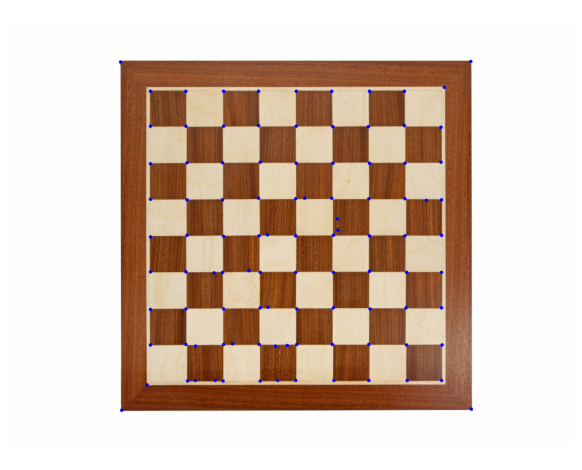

In [ ]:
corners = cv.goodFeaturesToTrack(gray, maxCorners=100, qualityLevel=0.01, minDistance=10)

# Buat copy gambar untuk Shi-Tomasi
img_shitomasi = img.copy()

# Convert corners ke integer
corners = np.int64(corners)

# Gambar circles pada setiap corner yang terdeteksi
for corner in corners:
    x, y = corner.ravel()
    cv.circle(img_shitomasi, (x, y), 3, (255, 0, 0), -1)

plt.imshow(cv.cvtColor(img_shitomasi, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.tight_layout()
plt.show()

## Implementasikan metode Hough Transform

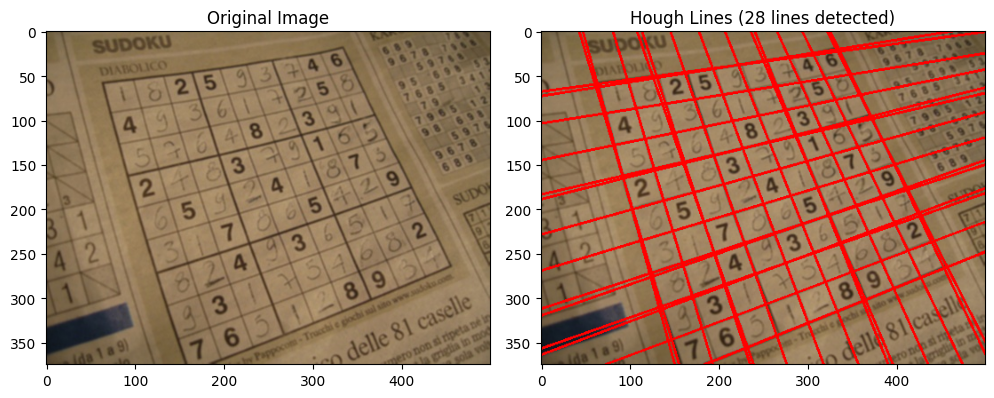

In [ ]:
filter = False

file_path = '/content/drive/MyDrive/PCVK/sudoku.jpg'
img = cv.imread(file_path)

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
edges = cv.Canny(gray, 90, 150, apertureSize=3)
kernel = np.ones((3,3), np.uint8)
edges = cv.dilate(edges, kernel, iterations=1)
kernel = np.ones((5,5), np.uint8)
edges = cv.erode(edges, kernel, iterations=1)

lines = cv.HoughLines(edges, 1, np.pi/140, 145)

if not lines.any():
    print('No lines were found')
    exit()

if filter:
    rho_threshold = 15
    theta_threshold = 0.1

    similar_lines = {i : [] for i in range(len(lines))}
    for i in range(len(lines)):
        for j in range(len(lines)):
            if i == j:
                continue

            rho_i,theta_i = lines[i][0]
            rho_j,theta_j = lines[j][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                similar_lines[i].append(j)

    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x : len(similar_lines[x]))

    line_flags = len(lines)*[True]
    for i in range(len(lines) - 1):
        if not line_flags[indices[i]]:
            continue

        for j in range(i + 1, len(lines)):
            if not line_flags[indices[j]]:
                continue

            rho_i,theta_i = lines[indices[i]][0]
            rho_j,theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags[indices[j]] = False

filtered_lines = []

if filter:
    for i in range(len(lines)):
        if line_flags[i]:
            filtered_lines.append(lines[i])
else:
    filtered_lines = lines

for line in filtered_lines:
    rho,theta = line[0]
    a = np.cos(theta)
    b = np.sin(theta)
    x0 = a*rho
    y0 = b*rho
    x1 = int(x0 + 1000*(-b))
    y1 = int(y0 + 1000*(a))
    x2 = int(x0 - 1000*(-b))
    y2 = int(y0 - 1000*(a))

    cv.line(img, (x1,y1), (x2,y2), (0,0,255), 2)

# Visualisasi hasil
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(cv.cvtColor(cv.imread(file_path), cv.COLOR_BGR2RGB))
plt.title('Original Image')

plt.subplot(1, 3, 2)
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
plt.title(f'Hough Lines ({len(filtered_lines)} lines detected)')

plt.tight_layout()
plt.show()


## Implementasikan fungsi findContours()

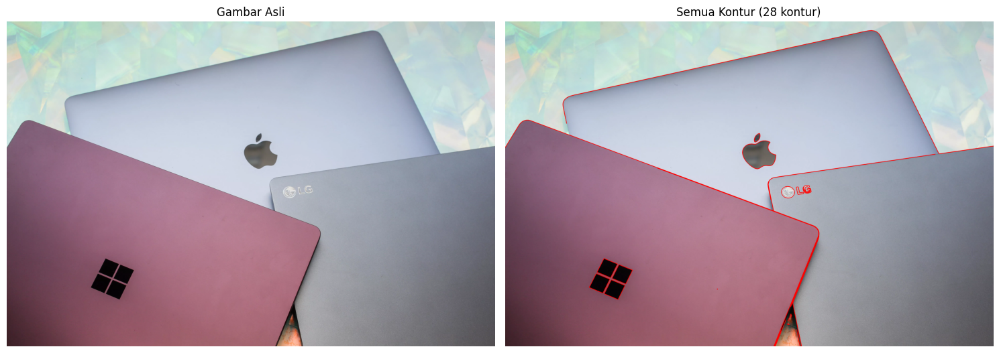

In [ ]:
img = cv.imread('/content/drive/MyDrive/PCVK/laptop.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Konversi ke grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Aplikasikan Gaussian Blur untuk mengurangi noise
blurred = cv.GaussianBlur(gray, (5, 5), 0)

# Deteksi tepi menggunakan Canny
edges = cv.Canny(blurred, 50, 150)

# Temukan kontur
contours, hierarchy = cv.findContours(edges, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_SIMPLE)

# Buat copy gambar untuk menggambar kontur
img_contours = img_rgb.copy()

# Gambar semua kontur yang terdeteksi
cv.drawContours(img_contours, contours, -1, (255, 0, 0), 3)

# Filter kontur berdasarkan area untuk mendeteksi laptop
min_area = 50000  # Area minimum untuk dianggap sebagai laptop
laptop_contours = [cnt for cnt in contours if cv.contourArea(cnt) > min_area]

# Buat gambar dengan kontur laptop yang terfilter
img_filtered = img_rgb.copy()
cv.drawContours(img_filtered, laptop_contours, -1, (255, 0, 0), 3)

# Tampilkan hasil
fig, axes = plt.subplots(1, 2, figsize=(15, 10))

# Gambar asli
axes[0].imshow(img_rgb)
axes[0].set_title('Gambar Asli')
axes[0].axis('off')

# Semua kontur
axes[1].imshow(img_contours)
axes[1].set_title(f'Semua Kontur ({len(contours)} kontur)')
axes[1].axis('off')

plt.tight_layout()
plt.show()


# D2. Praktikum Feature Matching dan Face Detection

## 1. Face Detection

### Citra Presiden Jokowi

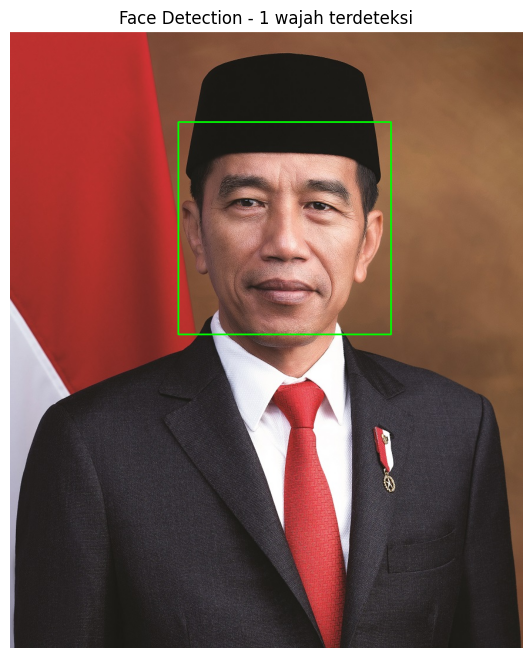

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/jokowi.jpg'
face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Baca gambar
img = cv.imread(img_path)

# Konversi ke grayscale untuk deteksi
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Deteksi wajah
faces = face_cascade.detectMultiScale(gray, 1.3, 5)

# Gambar rectangle untuk setiap wajah
for (x, y, w, h) in faces:
    cv.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

# Konversi BGR ke RGB untuk matplotlib
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Tampilkan dengan matplotlib
plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.title(f'Face Detection - {len(faces)} wajah terdeteksi')
plt.show()

### Citra Kartini

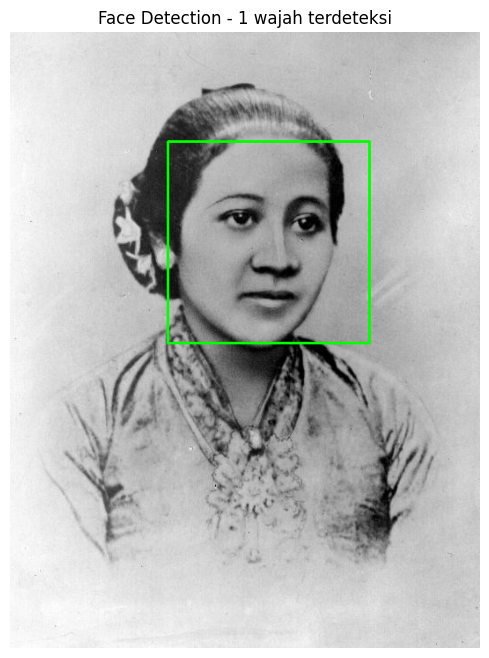

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/kartini.jpg'
face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Baca gambar
img = cv.imread(img_path)

# Konversi ke grayscale untuk deteksi
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Deteksi wajah
faces = face_cascade.detectMultiScale(gray, 1.3, 5)

# Gambar rectangle untuk setiap wajah
for (x, y, w, h) in faces:
    cv.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

# Konversi BGR ke RGB untuk matplotlib
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Tampilkan dengan matplotlib
plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.title(f'Face Detection - {len(faces)} wajah terdeteksi')
plt.show()

### Citra Kucing

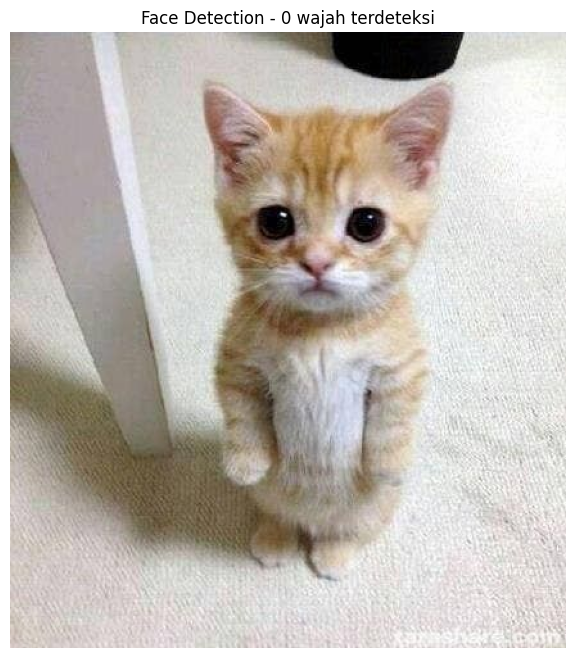

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/kitten01.jpg'
face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Baca gambar
img = cv.imread(img_path)

# Konversi ke grayscale untuk deteksi
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Deteksi wajah
faces = face_cascade.detectMultiScale(gray, 1.3, 5)

# Gambar rectangle untuk setiap wajah
for (x, y, w, h) in faces:
    cv.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

# Konversi BGR ke RGB untuk matplotlib
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Tampilkan dengan matplotlib
plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.title(f'Face Detection - {len(faces)} wajah terdeteksi')
plt.show()

### Citra Orang Bermasker

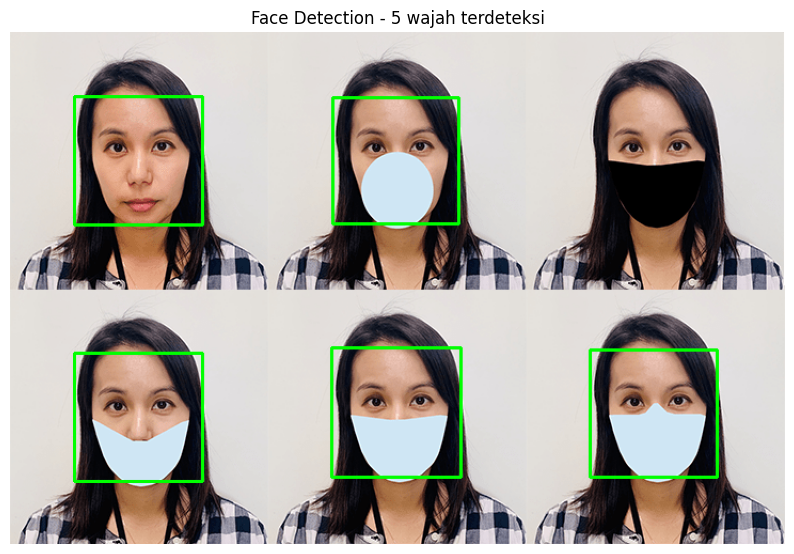

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/mask.png'
face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Baca gambar
img = cv.imread(img_path)

# Konversi ke grayscale untuk deteksi
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Deteksi wajah
faces = face_cascade.detectMultiScale(gray, 1.3, 5)

# Gambar rectangle untuk setiap wajah
for (x, y, w, h) in faces:
    cv.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

# Konversi BGR ke RGB untuk matplotlib
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Tampilkan dengan matplotlib
plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.title(f'Face Detection - {len(faces)} wajah terdeteksi')
plt.show()

### Citra Michael Jordan

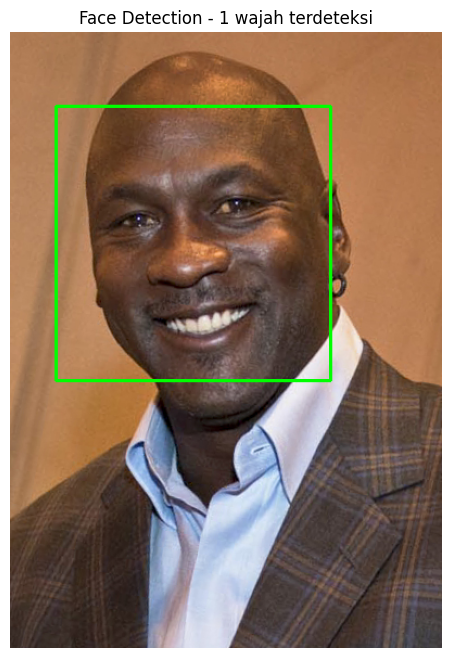

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/mjordan.jpg'
face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Baca gambar
img = cv.imread(img_path)

# Konversi ke grayscale untuk deteksi
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Deteksi wajah
faces = face_cascade.detectMultiScale(gray, 1.4, 7)

# Gambar rectangle untuk setiap wajah
for (x, y, w, h) in faces:
    cv.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

# Konversi BGR ke RGB untuk matplotlib
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Tampilkan dengan matplotlib
plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.title(f'Face Detection - {len(faces)} wajah terdeteksi')
plt.show()

### Citra Konferensi Solvay

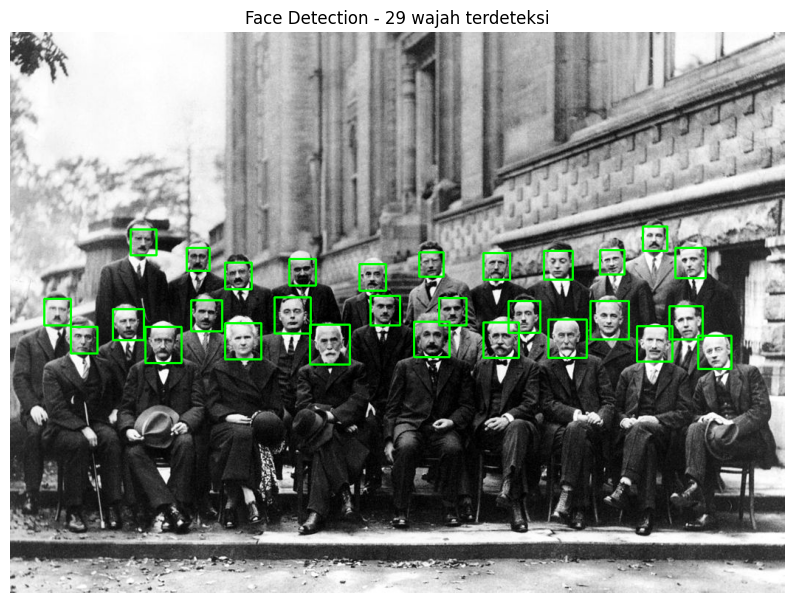

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/solvayconf.jpg'
face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Baca gambar
img = cv.imread(img_path)

# Konversi ke grayscale untuk deteksi
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Deteksi wajah
faces = face_cascade.detectMultiScale(gray, 1.055, 7)

# Gambar rectangle untuk setiap wajah
for (x, y, w, h) in faces:
    cv.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

# Konversi BGR ke RGB untuk matplotlib
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Tampilkan dengan matplotlib
plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.title(f'Face Detection - {len(faces)} wajah terdeteksi')
plt.show()

## 2. Face Detection pada Citra Kucing

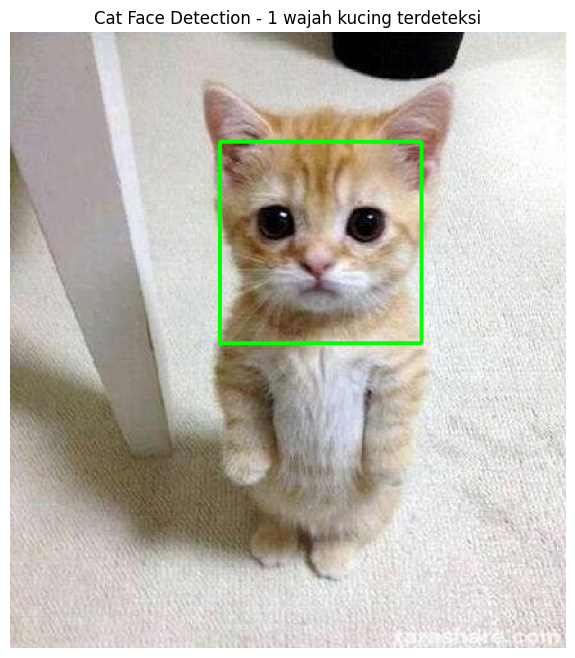

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/kitten01.jpg'
cat_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalcatface.xml')

# Baca gambar
img = cv.imread(img_path)

# Konversi ke grayscale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

cat_faces = cat_cascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=3,
    minSize=(75, 75)
)

# Gambar rectangle untuk setiap wajah kucing
for (x, y, w, h) in cat_faces:
    cv.rectangle(img, (x, y), (x+w, y+h), (0, 255, 0), 2)

img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Tampilkan gambar
plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.title(f'Cat Face Detection - {len(cat_faces)} wajah kucing terdeteksi')
plt.show()

## 3. Eyes Detection

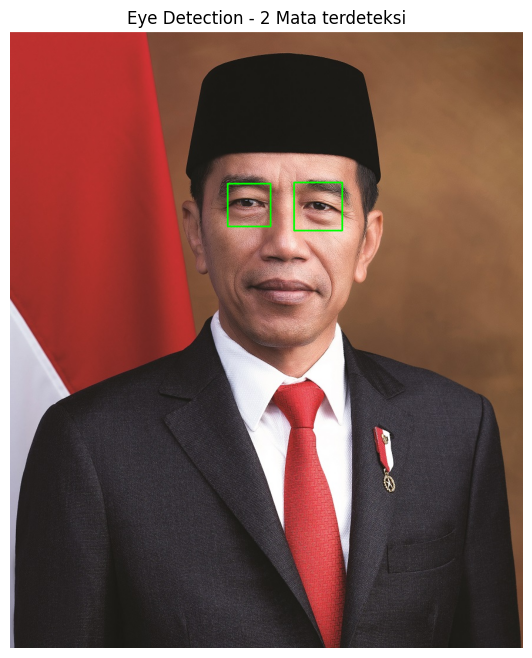

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/jokowi.jpg'

# Load Haar Cascade untuk wajah dan mata
face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')
eye_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_eye.xml')

img = cv.imread(img_path)

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Deteksi wajah terlebih dahulu
faces = face_cascade.detectMultiScale(gray, 1.3, 5, minSize=(50, 50))

for (x, y, w, h) in faces:
    # Region of Interest (ROI) untuk deteksi mata
    roi_gray = gray[y:y+h, x:x+w]
    roi_color = img[y:y+h, x:x+w]

    # Deteksi mata dalam ROI wajah dengan parameter tuning
    eyes = eye_cascade.detectMultiScale(
        roi_gray,
        scaleFactor=1.1,
        minNeighbors=5,
        minSize=(20, 20)
    )

    for (ex, ey, ew, eh) in eyes:
        cv.rectangle(roi_color, (ex, ey), (ex+ew, ey+eh), (0, 255, 0), 2)

# Konversi BGR ke RGB
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

# Tampilkan gambar
plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.title(f'Eye Detection - {len(eyes)} Mata terdeteksi')
plt.show()


## Smiles Detection

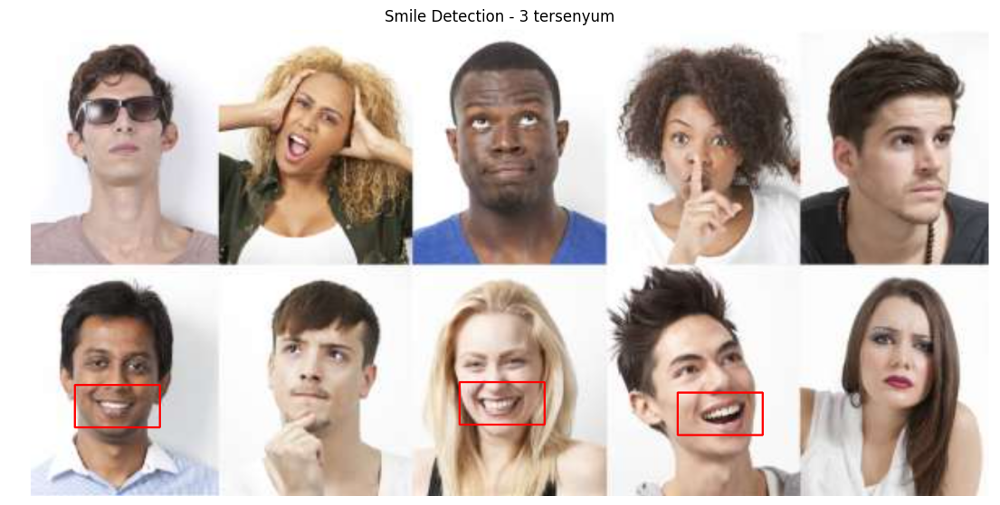

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/people.png'

face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')
smile_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_smile.xml')

img = cv.imread(img_path)
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

faces = face_cascade.detectMultiScale(
    gray,
    scaleFactor=1.1,
    minNeighbors=4,
    minSize=(40, 40)
)

smile_count = 0

for (x, y, w, h) in faces:
    mouth_y = y + int(h * 0.5)
    mouth_h = int(h * 0.5)

    roi_gray = gray[mouth_y:mouth_y+mouth_h, x:x+w]
    roi_color = img[mouth_y:mouth_y+mouth_h, x:x+w]

    smiles = smile_cascade.detectMultiScale(
        roi_gray,
        scaleFactor=1.5,
        minNeighbors=5,
        minSize=(50, 50)
    )

    if len(smiles) > 0:
        color = (0, 255, 0)
        smile_count += 1

        sx, sy, sw, sh = max(smiles, key=lambda x: x[2]*x[3])
        cv.rectangle(roi_color, (sx, sy), (sx+sw, sy+sh), (0, 0, 255), 2)

img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

plt.figure(figsize=(14, 10))
plt.imshow(img_rgb)
plt.axis('off')
plt.title(f'Smile Detection - {smile_count} tersenyum')
plt.show()


## Face Tracking


                   📸 CAPTURED PHOTO - FACE DETECTION RESULT

✓ Total faces detected: 1

🖼️  Result Image:



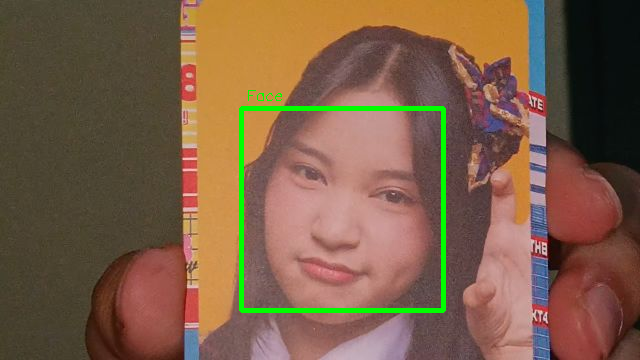

In [ ]:
from IPython.display import display, Javascript, Image, clear_output
from google.colab.output import eval_js
from google.colab.patches import cv2_imshow
from base64 import b64decode, b64encode
import cv2
import numpy as np
import PIL
import io

# Load Haar Cascade
face_cascade = cv2.CascadeClassifier(cv2.data.haarcascades + 'haarcascade_frontalface_default.xml')

# Function: Convert JS to OpenCV image
def js_to_image(js_reply):
    image_bytes = b64decode(js_reply.split(',')[1])
    jpg_as_np = np.frombuffer(image_bytes, dtype=np.uint8)
    img = cv2.imdecode(jpg_as_np, flags=1)
    return img

# Function: Convert bbox to bytes for overlay
def bbox_to_bytes(bbox_array):
    bbox_PIL = PIL.Image.fromarray(bbox_array, 'RGBA')
    iobuf = io.BytesIO()
    bbox_PIL.save(iobuf, format='png')
    bbox_bytes = 'data:image/png;base64,{}'.format((str(b64encode(iobuf.getvalue()), 'utf-8')))
    return bbox_bytes

# JavaScript for video streaming with CAPTURE button
def video_stream():
    js = Javascript('''
    var video;
    var div = null;
    var stream;
    var captureCanvas;
    var imgElement;
    var labelElement;
    var captureButton;

    var pendingResolve = null;
    var shutdown = false;
    var captureRequested = false;

    function removeDom() {
        stream.getVideoTracks()[0].stop();
        video.remove();
        div.remove();
        video = null;
        div = null;
        stream = null;
        imgElement = null;
        captureCanvas = null;
        labelElement = null;
    }

    function onAnimationFrame() {
        if (!shutdown) {
            window.requestAnimationFrame(onAnimationFrame);
        }
        if (pendingResolve) {
            var result = "";
            if (!shutdown) {
                captureCanvas.getContext('2d').drawImage(video, 0, 0, 640, 360);
                result = captureCanvas.toDataURL('image/jpeg', 0.8)
            }
            var lp = pendingResolve;
            pendingResolve = null;
            lp(result);
        }
    }

    async function createDom() {
        if (div !== null) {
            return stream;
        }

        div = document.createElement('div');
        div.style.border = '3px solid #4CAF50';
        div.style.padding = '10px';
        div.style.width = '100%';
        div.style.maxWidth = '660px';
        div.style.textAlign = 'center';
        document.body.appendChild(div);

        const title = document.createElement('h3');
        title.innerText = '📷 Face Detection Camera';
        div.appendChild(title);

        const modelOut = document.createElement('div');
        modelOut.innerHTML = "<span>Status: </span>";
        labelElement = document.createElement('span');
        labelElement.innerText = 'Initializing...';
        labelElement.style.fontWeight = 'bold';
        labelElement.style.color = '#4CAF50';
        modelOut.appendChild(labelElement);
        div.appendChild(modelOut);

        video = document.createElement('video');
        video.style.display = 'block';
        video.style.margin = '10px auto';
        video.width = 640;
        video.height = 360;
        video.setAttribute('playsinline', '');
        stream = await navigator.mediaDevices.getUserMedia({video: true});
        div.appendChild(video);

        imgElement = document.createElement('img');
        imgElement.style.position = 'absolute';
        imgElement.style.zIndex = 1;
        div.appendChild(imgElement);

        // CAPTURE BUTTON
        captureButton = document.createElement('button');
        captureButton.textContent = '📷 CAPTURE PHOTO';
        captureButton.style.cssText = 'padding:15px 40px; font-size:18px; background:#4CAF50; color:white; border:none; cursor:pointer; border-radius:8px; margin:10px; font-weight:bold';
        captureButton.onclick = () => {
            captureRequested = true;
            shutdown = true;
        };
        div.appendChild(captureButton);

        const instruction = document.createElement('div');
        instruction.innerHTML = '<span style="color: #666; font-size:14px">Green boxes show detected faces. Click CAPTURE when ready.</span>';
        div.appendChild(instruction);

        video.srcObject = stream;
        await video.play();

        captureCanvas = document.createElement('canvas');
        captureCanvas.width = 640;
        captureCanvas.height = 360;
        window.requestAnimationFrame(onAnimationFrame);

        return stream;
    }

    async function stream_frame(label, imgData) {
        if (shutdown) {
            removeDom();
            if (captureRequested) {
                return 'CAPTURE';
            }
            shutdown = false;
            return '';
        }

        stream = await createDom();

        if (label != "") {
            labelElement.innerHTML = label;
        }

        if (imgData != "") {
            var videoRect = video.getClientRects()[0];
            imgElement.style.top = videoRect.top + "px";
            imgElement.style.left = videoRect.left + "px";
            imgElement.style.width = videoRect.width + "px";
            imgElement.style.height = videoRect.height + "px";
            imgElement.src = imgData;
        }

        var result = await new Promise(function(resolve, reject) {
            pendingResolve = resolve;
        });

        return {'img': result};
    }
    ''')

    display(js)

def video_frame(label, bbox):
    data = eval_js('stream_frame("{}", "{}")'.format(label, bbox))
    return data

# Start streaming
print("🎥 Starting Face Detection Camera...\n")
video_stream()

label_html = 'Detecting faces...'
bbox = ''
captured_image = None

# Real-time detection loop
while True:
    js_reply = video_frame(label_html, bbox)

    if not js_reply:
        break

    if js_reply == 'CAPTURE':
        print("📸 Capture requested! Processing final frame...\n")
        break

    # Convert to OpenCV image
    img = js_to_image(js_reply["img"])
    captured_image = img.copy()

    # Get dimensions
    height, width = img.shape[:2]
    bbox_array = np.zeros([height, width, 4], dtype=np.uint8)

    # Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Detect faces
    faces = face_cascade.detectMultiScale(gray, 1.1, 5, minSize=(40, 40))

    # Draw bounding boxes with SMALLER font
    for (x, y, w, h) in faces:
        # Draw rectangle
        bbox_array = cv2.rectangle(bbox_array, (x, y), (x+w, y+h), (0, 255, 0, 255), 3)

        # Draw small label - font size 0.4 instead of 0.6
        cv2.putText(bbox_array, 'FACE', (x+2, y-5),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.4, (0, 255, 0, 255), 1)

    # Set alpha
    bbox_array[:, :, 3] = (bbox_array.max(axis=2) > 0).astype(int) * 255

    # Convert to bytes
    bbox_bytes = bbox_to_bytes(bbox_array)
    bbox = bbox_bytes

    # Update label
    if len(faces) > 0:
        label_html = f'✓ {len(faces)} face(s) detected'
    else:
        label_html = '⚠ No face detected'

# Display captured result
if captured_image is not None:
    clear_output(wait=True)

    print("\n" + "="*83)
    print("                   📸 CAPTURED PHOTO - FACE DETECTION RESULT")
    print("="*83 + "\n")

    # Final detection
    gray_final = cv2.cvtColor(captured_image, cv2.COLOR_RGB2GRAY)
    faces_final = face_cascade.detectMultiScale(gray_final, 1.1, 5, minSize=(40, 40))

    # Draw final boxes with SMALLER font
    for (x, y, w, h) in faces_final:
        # Green rectangle
        cv2.rectangle(captured_image, (x, y), (x+w, y+h), (0, 255, 0), 3)

        # Small label - font size 0.5 with thickness 1
        cv2.putText(captured_image, 'Face', (x+5, y-8),
                   cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 1)

    print(f"✓ Total faces detected: {len(faces_final)}\n")

    print("🖼️  Result Image:\n")

    # Display
    cv2_imshow(captured_image)

else:
    print("\n❌ No image captured")


> **UI Face Tracking**
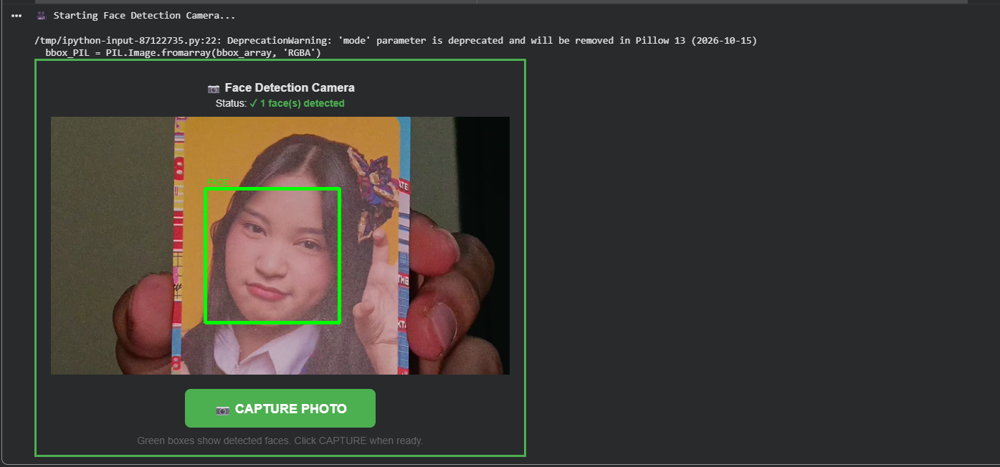

## Blurring pada bagian wajah yang terdeteksi

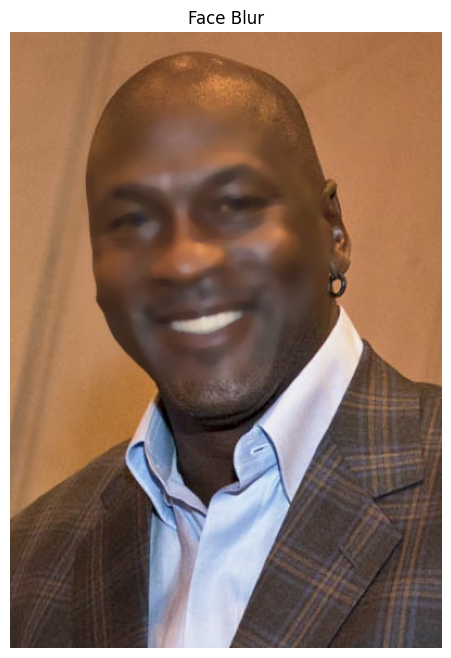

In [ ]:
img_path = '/content/drive/MyDrive/PCVK/mjordan.jpg'
img = cv.imread(img_path)

face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, 1.4, 7, minSize=(50, 50))

for (x, y, w, h) in faces:
    # Extract face region
    face_roi = img[y:y+h, x:x+w]

    # Apply blur
    blurred_face = cv.medianBlur(face_roi, 11)

    # Create ellipse mask
    mask = np.zeros((h, w), dtype=np.uint8)
    center = (w // 2, h // 2)
    axes = (w // 2, h // 2)

    # Draw filled ellipse
    cv.ellipse(mask, center, axes, 0, 0, 360, 255, -1)

    # SMOOTH THE EDGES: Apply Gaussian blur to mask for feathering effect
    mask = cv.GaussianBlur(mask, (21, 21), 11)

    # Normalize mask to 0-1 range
    mask_normalized = mask.astype(float) / 255.0

    # Expand to 3 channels
    mask_3d = np.repeat(mask_normalized[:, :, np.newaxis], 3, axis=2)

    # Blend images
    face_roi_float = face_roi.astype(float)
    blurred_face_float = blurred_face.astype(float)

    blended = (blurred_face_float * mask_3d + face_roi_float * (1 - mask_3d)).astype(np.uint8)

    # Replace
    img[y:y+h, x:x+w] = blended

# Display
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

plt.figure(figsize=(10, 8))
plt.imshow(img_rgb)
plt.axis('off')
plt.title('Face Blur')
plt.show()

## Mengolah gambar KTM

### Menampilkan Foto pada KTM

Processing KTM - Found 1 face(s)



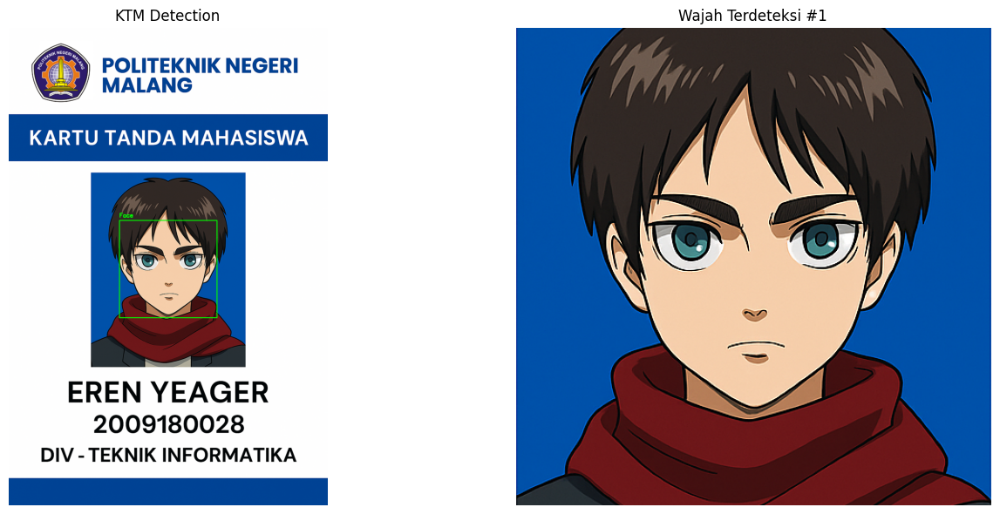

In [ ]:
ktm_path = '/content/drive/MyDrive/PCVK/ktm_eren.png'
img = cv.imread(ktm_path)
img_copy = img.copy()

face_cascade = cv.CascadeClassifier(cv.data.haarcascades + 'haarcascade_frontalface_default.xml')

gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)
faces = face_cascade.detectMultiScale(gray, 1.1, 5, minSize=(50, 50))

print(f"Processing KTM - Found {len(faces)} face(s)\n")

# Create figure with subplots
fig, axes = plt.subplots(1, len(faces) + 1, figsize=(15, 6))

# Show original KTM with detection box
for (x, y, w, h) in faces:
    cv.rectangle(img_copy, (x, y), (x+w, y+h), (0, 255, 0), 2)
    cv.putText(img_copy, 'Face', (x, y-10), cv.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

axes[0].imshow(cv.cvtColor(img_copy, cv.COLOR_BGR2RGB))
axes[0].set_title('KTM Detection')
axes[0].axis('off')

# Show extracted faces
for i, (x, y, w, h) in enumerate(faces, 1):
    # Add padding
    padding = int(w * 0.3)

    x_start = max(0, x - padding)
    y_start = max(0, y - padding)
    x_end = min(img.shape[1], x + w + padding)
    y_end = min(img.shape[0], y + h + padding)

    # Extract face
    face_with_bg = img[y_start:y_end, x_start:x_end]

    # Display
    axes[i].imshow(cv.cvtColor(face_with_bg, cv.COLOR_BGR2RGB))
    axes[i].set_title(f'Wajah Terdeteksi #{i}')
    axes[i].axis('off')

plt.tight_layout()
plt.show()


### Melakukan Deteksi Obyek KTM pada gambar yang berisi KTM dengan barang lainnya dengan menggunakan Konsep Feature Matching

Template keypoints: 1679
Scene keypoints: 3118



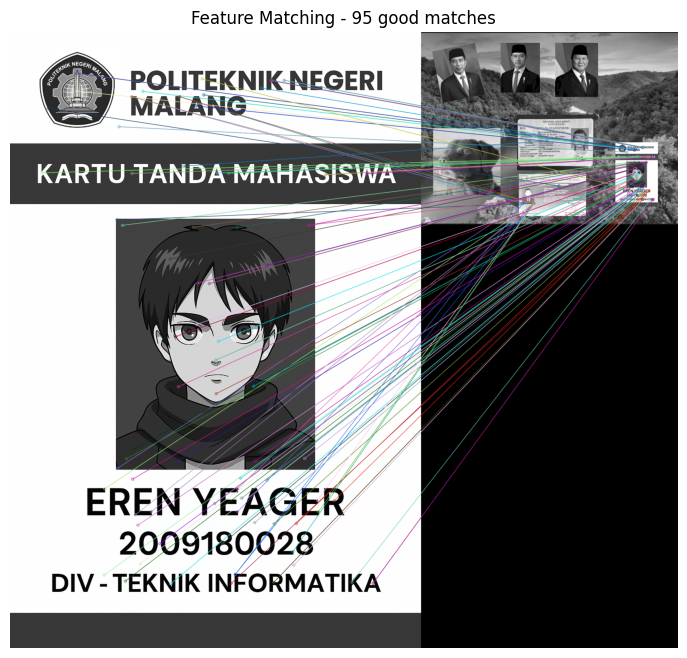

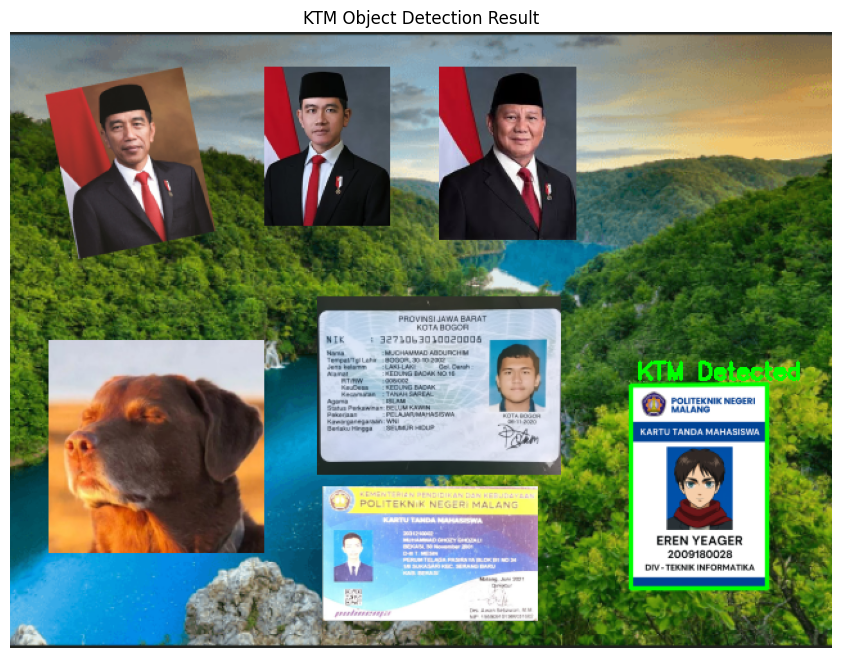

In [ ]:
template_path = '/content/drive/MyDrive/PCVK/ktm_eren.png'
scene_path = '/content/drive/MyDrive/PCVK/acak.png'

template = cv.imread(template_path, cv.IMREAD_GRAYSCALE)
scene = cv.imread(scene_path, cv.IMREAD_GRAYSCALE)

# 1. Create SIFT detector
sift = cv.SIFT_create()

# 2. Find keypoints and descriptors
kp1, des1 = sift.detectAndCompute(template, None)
kp2, des2 = sift.detectAndCompute(scene, None)

print(f"Template keypoints: {len(kp1)}")
print(f"Scene keypoints: {len(kp2)}\n")

# 3. FLANN based matcher
FLANN_INDEX_KDTREE = 1
index_params = dict(algorithm=FLANN_INDEX_KDTREE, trees=5)
search_params = dict(checks=50)

flann = cv.FlannBasedMatcher(index_params, search_params)
matches = flann.knnMatch(des1, des2, k=2)

# 4. Apply ratio test
good_matches = []
for m, n in matches:
    if m.distance < 0.7 * n.distance:
        good_matches.append(m)

# 5. Draw good matches
img_matches = cv.drawMatches(template, kp1, scene, kp2, good_matches, None,
                              flags=cv.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS)

plt.figure(figsize=(15, 8))
plt.imshow(img_matches, cmap='gray')
plt.axis('off')
plt.title(f'Feature Matching - {len(good_matches)} good matches')
plt.show()

# 6. Find homography and draw bounding box
MIN_MATCH_COUNT = 10

if len(good_matches) > MIN_MATCH_COUNT:
    src_pts = np.float32([kp1[m.queryIdx].pt for m in good_matches]).reshape(-1, 1, 2)
    dst_pts = np.float32([kp2[m.trainIdx].pt for m in good_matches]).reshape(-1, 1, 2)

    M, mask = cv.findHomography(src_pts, dst_pts, cv.RANSAC, 5.0)
    matches_mask = mask.ravel().tolist()

    if M is not None:
        h, w = template.shape
        pts = np.float32([[0, 0], [0, h-1], [w-1, h-1], [w-1, 0]]).reshape(-1, 1, 2)
        dst = cv.perspectiveTransform(pts, M)

        scene_color = cv.imread(scene_path)
        scene_with_ktm = cv.polylines(scene_color, [np.int32(dst)], True, (0, 255, 0), 2, cv.LINE_AA)

        # FIXED: Add smaller text label
        cv.putText(scene_with_ktm, 'KTM Detected', (int(dst[0][0][0])+5, int(dst[0][0][1])-5),
                   cv.FONT_HERSHEY_SIMPLEX, 0.6, (0, 255, 0), 2)

        plt.figure(figsize=(12, 8))
        plt.imshow(cv.cvtColor(scene_with_ktm, cv.COLOR_BGR2RGB))
        plt.axis('off')
        plt.title('KTM Object Detection Result')
        plt.show()

    else:
        print("❌ Homography matrix not found")
else:
    print(f"❌ Not enough matches: {len(good_matches)}/{MIN_MATCH_COUNT}")
